In [3]:
import sys
import os.path as osp
import os
import json
import pickle
import time
import itertools
import skimage.io as io
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon, Rectangle
from pprint import pprint
import numpy as np
from external import mask

In [16]:
class REFER:
    def __init__(self, data_root, dataset='refcoco', splitBy='unc'):
        self.CURRENT_DIR = os.getcwd()
        self.ROOT_DIR = os.path.dirname(os.path.realpath('__file__'))
        self.DATA_DIR = os.path.join(data_root, dataset)
        if dataset in ['refcoco', 'refcoco+', 'refcocog']:
            self.IMAGE_DIR = os.path.join(data_root, 'images/mscoco')
        elif dataset == 'refclef':
            self.IMAGE_DIR = os.path.join(data_root, 'images/saiapr_tc-12')
        else:
            print('No refer dataset is called [%s]').format(dataset)
            sys.exit()
    
    
    # load refs from data/dataset/refs(dataset).json
        tic = time.time()
        ref_file = os.path.join(self.DATA_DIR, 'refs('+splitBy+').p')
        self.data = {}
        self.data['dataset'] = dataset
        self.data['refs'] = pickle.load(open(ref_file, 'rb'))
        #self.data['refs'] = [line for line in open(ref_file, 'r')]

        # load annotations from data/dataset/instances.json
        instances_file = osp.join(self.DATA_DIR, 'instances.json')
        instances = json.load(open(instances_file, 'r'))
        self.data['images'] = instances['images']
        self.data['annotations'] = instances['annotations']
        self.data['categories'] = instances['categories']

        # create index
        self.createIndex()
        print('DONE (t=%.2fs)'.format((time.time()-tic)))
    
    def createIndex(self):
        """
        # create sets of mapping
        # 1)  Refs: 	 	{ref_id: ref}
        # 2)  Anns: 	 	{ann_id: ann}
        # 3)  Imgs:		 	{image_id: image}
        # 4)  Cats: 	 	{category_id: category_name}
        # 5)  Sents:     	{sent_id: sent}
        # 6)  imgToRefs: 	{image_id: refs}
        # 7)  imgToAnns: 	{image_id: anns}
        # 8)  refToAnn:  	{ref_id: ann}
        # 9)  annToRef:  	{ann_id: ref}
        # 10) catToRefs: 	{category_id: refs}
        # 11) sentToRef: 	{sent_id: ref}
        # 12) sentToTokens: {sent_id: tokens}
        
        
        
        """
        
        print('creating index...')
        # fetch info from instances
        Anns, Imgs, Cats, imgToAnns = {}, {}, {}, {}
        for ann in self.data['annotations']:
            Anns[ann['id']] = ann
            imgToAnns[ann['image_id']] = imgToAnns.get(ann['image_id'], []) + [ann]
        for img in self.data['images']:
            Imgs[img['id']] = img
        for cat in self.data['categories']:
            Cats[cat['id']] = cat['name']

        # fetch info from refs
        Refs, imgToRefs, refToAnn, annToRef, catToRefs = {}, {}, {}, {}, {}
        Sents, sentToRef, sentToTokens = {}, {}, {}
        for ref in self.data['refs']:
            # ids
            ref_id = ref['ref_id']
            ann_id = ref['ann_id']
            category_id = ref['category_id']
            image_id = ref['image_id']

            # add mapping related to ref
            Refs[ref_id] = ref
            imgToRefs[image_id] = imgToRefs.get(image_id, []) + [ref]
            catToRefs[category_id] = catToRefs.get(category_id, []) + [ref]
            refToAnn[ref_id] = Anns[ann_id]
            annToRef[ann_id] = ref

            # add mapping of sent
            for sent in ref['sentences']:
                Sents[sent['sent_id']] = sent
                sentToRef[sent['sent_id']] = ref
                sentToTokens[sent['sent_id']] = sent['tokens']
                
        # create class members
        self.Refs = Refs
        self.Anns = Anns
        self.Imgs = Imgs
        self.Cats = Cats
        self.Sents = Sents
        self.imgToRefs = imgToRefs
        self.imgToAnns = imgToAnns
        self.refToAnn = refToAnn
        self.annToRef = annToRef
        self.catToRefs = catToRefs
        self.sentToRef = sentToRef
        self.sentToTokens = sentToTokens
        print('index created.')
        
    def getRefIds(self, image_ids=[], cat_ids=[], ref_ids=[], split=''):
        image_ids = image_ids if type(image_ids) == list else [image_ids]
        cat_ids = cat_ids if type(cat_ids) == list else [cat_ids]
        ref_ids = ref_ids if type(ref_ids) == list else [ref_ids]

        if len(image_ids)==len(cat_ids)==len(ref_ids)==len(split)==0:
            refs = self.data['refs']
        else:
            if not len(image_ids) == 0:
                refs = [self.imgToRefs[image_id] for image_id in image_ids]
            else:
                refs = self.data['refs']
            if not len(cat_ids) == 0:
                refs = [ref for ref in refs if ref['category_id'] in cat_ids]
            if not len(ref_ids) == 0:
                refs = [ref for ref in refs if ref['ref_id'] in ref_ids]
            if not len(split) == 0:
                if split in ['testA', 'testB', 'testC']:
                    refs = [ref for ref in refs if split[-1] in ref['split']] # we also consider testAB, testBC, ...
                elif split in ['testAB', 'testBC', 'testAC']:
                    refs = [ref for ref in refs if ref['split'] == split]  # rarely used I guess...
                elif split == 'test':
                    refs = [ref for ref in refs if 'test' in ref['split']]
                elif split == 'train' or split == 'val':
                    refs = [ref for ref in refs if ref['split'] == split]
                else:
                    print('No such split [%s]'.format(split))
                    sys.exit()
        ref_ids = [ref['ref_id'] for ref in refs]
        return ref_ids
    
    def getAnnIds(self, image_ids=[], cat_ids=[], ref_ids=[]):
        image_ids = image_ids if type(image_ids) == list else [image_ids]
        cat_ids = cat_ids if type(cat_ids) == list else [cat_ids]
        ref_ids = ref_ids if type(ref_ids) == list else [ref_ids]

        if len(image_ids) == len(cat_ids) == len(ref_ids) == 0:
            ann_ids = [ann['id'] for ann in self.data['annotations']]
        else:
            if not len(image_ids) == 0:
                lists = [self.imgToAnns[image_id] for image_id in image_ids if image_id in self.imgToAnns]  # list of [anns]
                anns = list(itertools.chain.from_iterable(lists))
            else:
                anns = self.data['annotations']
            if not len(cat_ids) == 0:
                anns = [ann for ann in anns if ann['category_id'] in cat_ids]
            ann_ids = [ann['id'] for ann in anns]
            if not len(ref_ids) == 0:
                ids = set(ann_ids).intersection(set([self.Refs[ref_id]['ann_id'] for ref_id in ref_ids]))
        return ann_ids
    
    
    def getImgIds(self, ref_ids=[]):
        ref_ids = ref_ids if type(ref_ids) == list else [ref_ids]

        if not len(ref_ids) == 0:
            image_ids = list(set([self.Refs[ref_id]['image_id'] for ref_id in ref_ids]))
        else:
            image_ids = self.Imgs.keys()
        return image_ids

    def getCatIds(self):
        return self.Cats.keys()

    def loadRefs(self, ref_ids=[]):
        if type(ref_ids) == list:
            return [self.Refs[ref_id] for ref_id in ref_ids]
        elif type(ref_ids) == int:
            return [self.Refs[ref_ids]]

    def loadAnns(self, ann_ids=[]):
        if type(ann_ids) == list:
            return [self.Anns[ann_id] for ann_id in ann_ids]
        elif type(ann_ids) == int or type(ann_ids) == str:
            return [self.Anns[ann_ids]]

    def loadImgs(self, image_ids=[]):
        if type(image_ids) == list:
            return [self.Imgs[image_id] for image_id in image_ids]
        elif type(image_ids) == int:
            return [self.Imgs[image_ids]]

    def loadCats(self, cat_ids=[]):
        if type(cat_ids) == list:
            return [self.Cats[cat_id] for cat_id in cat_ids]
        elif type(cat_ids) == int:
            return [self.Cats[cat_ids]]

    def getRefBox(self, ref_id):
        ref = self.Refs[ref_id]
        ann = self.refToAnn[ref_id]
        return ann['bbox']  # [x, y, w, h]
    
    def showRef(self, ref, seg_box='seg'):
        ax = plt.gca()
        # show image
        image = self.Imgs[ref['image_id']]
        I = io.imread(os.path.join(self.IMAGE_DIR, image['file_name']))
        ax.imshow(I)
        # show refer expression
        for sid, sent in enumerate(ref['sentences']):
            print('%s. %s'.format((sid+1, sent['sent'])))
        # show segmentations
        if seg_box == 'seg':
            ann_id = ref['ann_id']
            ann = self.Anns[ann_id]
            polygons = []
            color = []
            c = 'none'
            if type(ann['segmentation'][0]) == list:
                # polygon used for refcoco*
                for seg in ann['segmentation']:
                    poly = np.array(seg).reshape((len(seg)/2, 2))
                    polygons.append(Polygon(poly, True, alpha=0.4))
                    color.append(c)
                p = PatchCollection(polygons, facecolors=color, edgecolors=(1,1,0,0), linewidths=3, alpha=1)
                ax.add_collection(p)  # thick yellow polygon
                p = PatchCollection(polygons, facecolors=color, edgecolors=(1,0,0,0), linewidths=1, alpha=1)
                ax.add_collection(p)  # thin red polygon
            else:
                # mask used for refclef
                rle = ann['segmentation']
                m = mask.decode(rle)
                img = np.ones( (m.shape[0], m.shape[1], 3) )
                color_mask = np.array([2.0,166.0,101.0])/255
                for i in range(3):
                    img[:,:,i] = color_mask[i]
                ax.imshow(np.dstack( (img, m*0.5) ))
        # show bounding-box
        elif seg_box == 'box':
            ann_id = ref['ann_id']
            ann = self.Anns[ann_id]
            bbox = 	self.getRefBox(ref['ref_id'])
            box_plot = Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], fill=False, edgecolor='green', linewidth=3)
            ax.add_patch(box_plot)

    def getMask(self, ref):
        # return mask, area and mask-center
        ann = self.refToAnn[ref['ref_id']]
        image = self.Imgs[ref['image_id']]
        if type(ann['segmentation'][0]) == list: # polygon
            rle = mask.frPyObjects(ann['segmentation'], image['height'], image['width'])
        else:
            rle = ann['segmentation']
        m = mask.decode(rle)
        m = np.sum(m, axis=2)  # sometimes there are multiple binary map (corresponding to multiple segs)
        m = m.astype(np.uint8) # convert to np.uint8
        # compute area
        area = sum(mask.area(rle))  # should be close to ann['area']
        return {'mask': m, 'area': area}
    
    def showMask(self, ref):
        M = self.getMask(ref)
        msk = M['mask']
        ax = plt.gca()
        ax.imshow(msk)

creating index...
index created.
DONE (t=%.2fs)
49822
25799
25799
There are %s training referred objects.
{'image_id': 519404, 'split': 'train', 'sentences': [{'tokens': ['two', 'woman', 'one', 'in', 'black', 'eatting', 'and', 'the', 'other', 'has', 'a', 'white', 'shirt', 'at', 'the', 'desk'], 'raw': 'Two woman one in black eatting and the other has a white shirt at the desk', 'sent_id': 0, 'sent': 'two woman one in black eatting and the other has a white shirt at the desk'}, {'tokens': ['woman', 'in', 'white', 'shirt', 'looking', 'down', 'at', 'laptop', 'computer'], 'raw': 'Woman in white shirt looking down at laptop computer.', 'sent_id': 1, 'sent': 'woman in white shirt looking down at laptop computer'}], 'file_name': 'COCO_train2014_000000519404_1241542.jpg', 'category_id': 1, 'ann_id': 1241542, 'sent_ids': [0, 1], 'ref_id': 5000}
The label is %s.
%s. %s
%s. %s


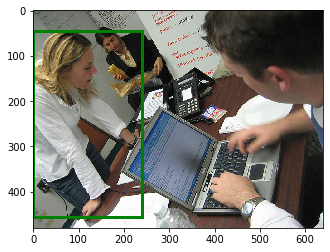

{'image_id': 181828, 'split': 'train', 'sentences': [{'tokens': ['a', 'tv', 'with', 'a', 'woman', 'being', 'interviewed', 'on', 'it'], 'raw': 'A TV with a woman being interviewed on it.', 'sent_id': 4, 'sent': 'a tv with a woman being interviewed on it'}, {'tokens': ['a', 'woman', 'with', 'sunglasses', 'on', 'her', 'head', 'on', 'the', 'television', 'being', 'interviewed'], 'raw': 'A woman with sunglasses on her head on the television being interviewed.', 'sent_id': 5, 'sent': 'a woman with sunglasses on her head on the television being interviewed'}], 'file_name': 'COCO_train2014_000000181828_33583.jpg', 'category_id': 72, 'ann_id': 33583, 'sent_ids': [4, 5], 'ref_id': 5001}
The label is %s.
%s. %s
%s. %s


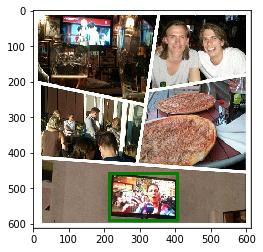

{'image_id': 380440, 'split': 'train', 'sentences': [{'tokens': ['the', 'man', 'in', 'yellow', 'coat'], 'raw': 'the man in yellow coat', 'sent_id': 8, 'sent': 'the man in yellow coat'}, {'tokens': ['skiier', 'in', 'red', 'pants'], 'raw': 'Skiier in red pants.', 'sent_id': 9, 'sent': 'skiier in red pants'}], 'file_name': 'COCO_train2014_000000380440_491042.jpg', 'category_id': 1, 'ann_id': 491042, 'sent_ids': [8, 9], 'ref_id': 5002}
The label is %s.
%s. %s
%s. %s


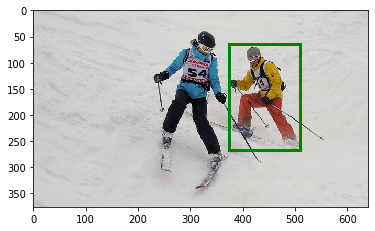

{'image_id': 419645, 'split': 'train', 'sentences': [{'tokens': ['there', 'is', 'red', 'colored', 'truck', 'in', 'between', 'the', 'other', 'trucks'], 'raw': 'There is red colored truck in between the other trucks', 'sent_id': 10, 'sent': 'there is red colored truck in between the other trucks'}, {'tokens': ['a', 'shiny', 'red', 'vintage', 'pickup', 'truck'], 'raw': 'A shiny red vintage pickup truck', 'sent_id': 11, 'sent': 'a shiny red vintage pickup truck'}], 'file_name': 'COCO_train2014_000000419645_398406.jpg', 'category_id': 8, 'ann_id': 398406, 'sent_ids': [10, 11], 'ref_id': 5003}
The label is %s.
%s. %s
%s. %s


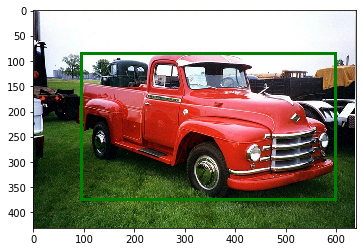

{'image_id': 38850, 'split': 'train', 'sentences': [{'tokens': ['a', 'young', 'boy', 'doing', 'a', 'skateboard', 'trick', 'on', 'a', 'blue', 'board'], 'raw': 'A young boy doing a skateboard trick on a blue board', 'sent_id': 12, 'sent': 'a young boy doing a skateboard trick on a blue board'}, {'tokens': ['a', 'man', 'jumping', 'with', 'a', 'skateboard'], 'raw': 'A man jumping with a skateboard', 'sent_id': 13, 'sent': 'a man jumping with a skateboard'}], 'file_name': 'COCO_train2014_000000038850_442348.jpg', 'category_id': 1, 'ann_id': 442348, 'sent_ids': [12, 13], 'ref_id': 5004}
The label is %s.
%s. %s
%s. %s


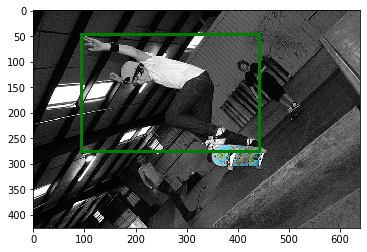

{'image_id': 478885, 'split': 'train', 'sentences': [{'tokens': ['a', 'apple', 'desktop', 'computer'], 'raw': 'A apple desktop computer', 'sent_id': 14, 'sent': 'a apple desktop computer'}, {'tokens': ['the', 'white', 'imac', 'computer', 'that', 'is', 'also', 'turned', 'on'], 'raw': 'the white IMac computer that is also turned on', 'sent_id': 15, 'sent': 'the white imac computer that is also turned on'}], 'file_name': 'COCO_train2014_000000478885_124383.jpg', 'category_id': 72, 'ann_id': 124383, 'sent_ids': [14, 15], 'ref_id': 5005}
The label is %s.
%s. %s
%s. %s


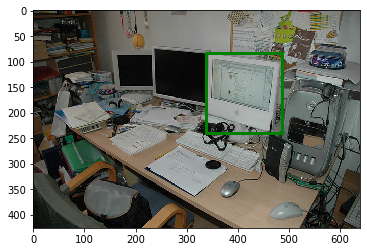

{'image_id': 393325, 'split': 'train', 'sentences': [{'tokens': ['a', 'long', '-', 'horn', ',', 'long', '-', 'haired', 'brown', 'cow', 'looking', 'at', 'the', 'camera'], 'raw': 'A long-horn, long-haired brown cow looking at the camera.', 'sent_id': 16, 'sent': 'a long - horn , long - haired brown cow looking at the camera'}, {'tokens': ['a', 'brown', 'bull', 'in', 'front', 'of', 'feeding', 'tub'], 'raw': 'A brown bull in front of feeding tub.', 'sent_id': 17, 'sent': 'a brown bull in front of feeding tub'}], 'file_name': 'COCO_train2014_000000393325_71545.jpg', 'category_id': 21, 'ann_id': 71545, 'sent_ids': [16, 17], 'ref_id': 5006}
The label is %s.
%s. %s
%s. %s


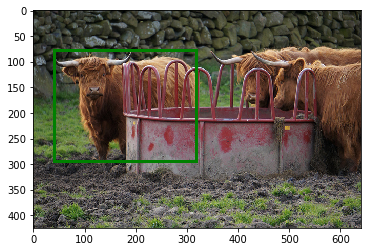

{'image_id': 289971, 'split': 'train', 'sentences': [{'tokens': ['the', 'woman', 'in', 'black', 'dress'], 'raw': 'The woman in black dress.', 'sent_id': 18, 'sent': 'the woman in black dress'}, {'tokens': ['a', 'lady', 'in', 'a', 'black', 'dress', 'cuts', 'a', 'wedding', 'cake', 'with', 'her', 'new', 'husband'], 'raw': 'A lady in a black dress cuts a wedding cake with her new husband.', 'sent_id': 19, 'sent': 'a lady in a black dress cuts a wedding cake with her new husband'}], 'file_name': 'COCO_train2014_000000289971_209158.jpg', 'category_id': 1, 'ann_id': 209158, 'sent_ids': [18, 19], 'ref_id': 5007}
The label is %s.
%s. %s
%s. %s


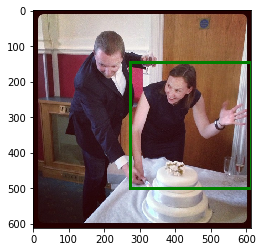

{'image_id': 451588, 'split': 'train', 'sentences': [{'tokens': ['a', 'baby', 'elephant', 'standing', 'in', 'front', 'of', 'a', 'larger', 'elephant'], 'raw': 'A baby elephant standing in front of a larger elephant.', 'sent_id': 20, 'sent': 'a baby elephant standing in front of a larger elephant'}, {'tokens': ['a', 'small', 'eliphant'], 'raw': 'a small eliphant', 'sent_id': 21, 'sent': 'a small eliphant'}], 'file_name': 'COCO_train2014_000000451588_581424.jpg', 'category_id': 22, 'ann_id': 581424, 'sent_ids': [20, 21], 'ref_id': 5008}
The label is %s.
%s. %s
%s. %s


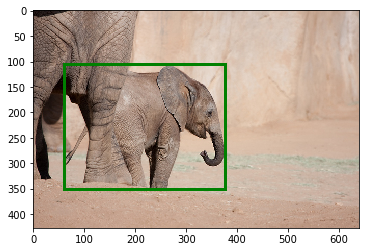

{'image_id': 278135, 'split': 'train', 'sentences': [{'tokens': ['a', 'bird', 'that', 'is', 'close', 'to', 'the', 'baby', 'in', 'a', 'pink', 'shirt'], 'raw': 'A bird that is close to the baby in a pink shirt.', 'sent_id': 22, 'sent': 'a bird that is close to the baby in a pink shirt'}, {'tokens': ['a', 'bird', 'standing', 'on', 'the', 'shoulder', 'of', 'a', 'person', 'with', 'its', 'tail', 'touching', 'her', 'face'], 'raw': 'A bird standing on the shoulder of a person with its tail touching her face.', 'sent_id': 23, 'sent': 'a bird standing on the shoulder of a person with its tail touching her face'}], 'file_name': 'COCO_train2014_000000278135_38810.jpg', 'category_id': 16, 'ann_id': 38810, 'sent_ids': [22, 23], 'ref_id': 5009}
The label is %s.
%s. %s
%s. %s


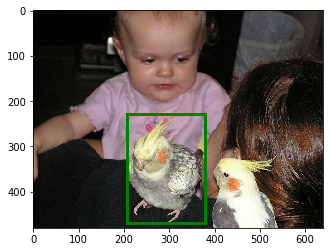

{'image_id': 399010, 'split': 'train', 'sentences': [{'tokens': ['salomon', 'cross', '-', 'country', 'skis', 'placed', 'together', 'on', 'the', 'ground', 'next', 'to', 'a', 'skiier'], 'raw': 'Salomon cross-country skis placed together on the ground next to a skiier.', 'sent_id': 24, 'sent': 'salomon cross - country skis placed together on the ground next to a skiier'}, {'tokens': ['ski', 'on', 'the', 'ground', 'beside', 'the', 'man', "'", 's', 'gloves', 'on', 'the', 'ground'], 'raw': "ski on the ground beside the man's gloves on the ground", 'sent_id': 25, 'sent': "ski on the ground beside the man ' s gloves on the ground"}], 'file_name': 'COCO_train2014_000000399010_1845112.jpg', 'category_id': 35, 'ann_id': 1845112, 'sent_ids': [24, 25], 'ref_id': 5010}
The label is %s.
%s. %s
%s. %s


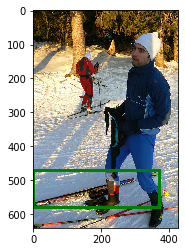

{'image_id': 267111, 'split': 'train', 'sentences': [{'tokens': ['the', 'white', 'storage', 'container', 'with', 'the', 'lettering', 'matson'], 'raw': 'The white storage container with the lettering Matson.', 'sent_id': 26, 'sent': 'the white storage container with the lettering matson'}, {'tokens': ['white', 'tractor', 'trailer'], 'raw': 'white tractor trailer', 'sent_id': 27, 'sent': 'white tractor trailer'}], 'file_name': 'COCO_train2014_000000267111_401495.jpg', 'category_id': 8, 'ann_id': 401495, 'sent_ids': [26, 27], 'ref_id': 5011}
The label is %s.
%s. %s
%s. %s


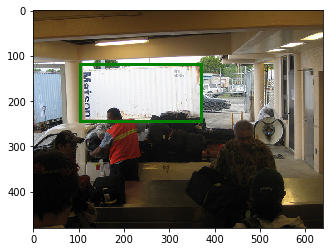

{'image_id': 323240, 'split': 'train', 'sentences': [{'tokens': ['a', 'girl', 'wearing', 'glasses', 'and', 'a', 'pink', 'shirt'], 'raw': 'A girl wearing glasses and a pink shirt', 'sent_id': 31, 'sent': 'a girl wearing glasses and a pink shirt'}, {'tokens': ['an', 'asian', 'girl', 'with', 'a', 'pink', 'shirt', 'eating', 'at', 'the', 'table'], 'raw': 'an Asian girl with a pink shirt eating at the table', 'sent_id': 32, 'sent': 'an asian girl with a pink shirt eating at the table'}], 'file_name': 'COCO_train2014_000000323240_192943.jpg', 'category_id': 1, 'ann_id': 192943, 'sent_ids': [31, 32], 'ref_id': 5013}
The label is %s.
%s. %s
%s. %s


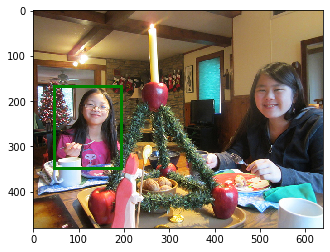

{'image_id': 342963, 'split': 'train', 'sentences': [{'tokens': ['a', 'woman', 'in', 'a', 'flowered', 'shirt'], 'raw': 'A woman in a flowered shirt.', 'sent_id': 33, 'sent': 'a woman in a flowered shirt'}, {'tokens': ['woman', 'in', 'red', 'shirt'], 'raw': 'woman in red shirt', 'sent_id': 34, 'sent': 'woman in red shirt'}], 'file_name': 'COCO_train2014_000000342963_526172.jpg', 'category_id': 1, 'ann_id': 526172, 'sent_ids': [33, 34], 'ref_id': 5014}
The label is %s.
%s. %s
%s. %s


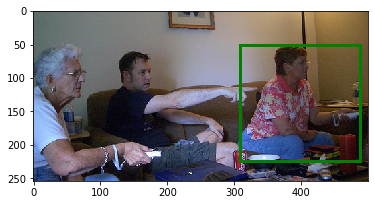

{'image_id': 360637, 'split': 'train', 'sentences': [{'tokens': ['a', 'fridge', 'with', 'lots', 'of', 'magnets', 'on', 'it'], 'raw': 'A fridge with lots of magnets on it', 'sent_id': 35, 'sent': 'a fridge with lots of magnets on it'}, {'tokens': ['white', 'fridge', 'with', 'lots', 'of', 'magnets', 'and', 'pictures', 'on', 'the', 'front'], 'raw': 'White fridge with lots of magnets and pictures on the front.', 'sent_id': 36, 'sent': 'white fridge with lots of magnets and pictures on the front'}], 'file_name': 'COCO_train2014_000000360637_331994.jpg', 'category_id': 82, 'ann_id': 331994, 'sent_ids': [35, 36], 'ref_id': 5015}
The label is %s.
%s. %s
%s. %s


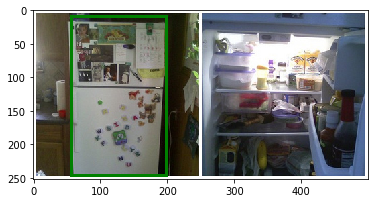

{'image_id': 41700, 'split': 'train', 'sentences': [{'tokens': ['woman', 'in', 'coveralls'], 'raw': 'WOMAN IN COVERALLS', 'sent_id': 37, 'sent': 'woman in coveralls'}, {'tokens': ['a', 'person', 'wearing', 'overalls'], 'raw': 'a person wearing overalls', 'sent_id': 38, 'sent': 'a person wearing overalls'}], 'file_name': 'COCO_train2014_000000041700_197196.jpg', 'category_id': 1, 'ann_id': 197196, 'sent_ids': [37, 38], 'ref_id': 5016}
The label is %s.
%s. %s
%s. %s


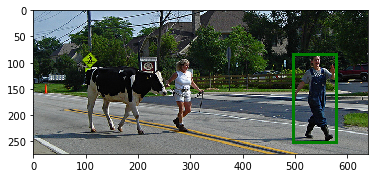

{'image_id': 191734, 'split': 'train', 'sentences': [{'tokens': ['a', 'blue', 'bike', 'which', 'come', 'first'], 'raw': 'A blue bike which come first', 'sent_id': 39, 'sent': 'a blue bike which come first'}, {'tokens': ['the', 'blue', 'dirt', 'bike'], 'raw': 'the blue dirt bike', 'sent_id': 40, 'sent': 'the blue dirt bike'}], 'file_name': 'COCO_train2014_000000191734_156184.jpg', 'category_id': 4, 'ann_id': 156184, 'sent_ids': [39, 40], 'ref_id': 5017}
The label is %s.
%s. %s
%s. %s


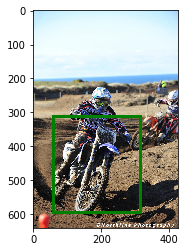

{'image_id': 262869, 'split': 'train', 'sentences': [{'tokens': ['blue', 'and', 'white', 'striped', 'board'], 'raw': 'blue and white striped board', 'sent_id': 41, 'sent': 'blue and white striped board'}, {'tokens': ['the', 'blue', 'and', 'white', 'striped', 'snowboard'], 'raw': 'The blue and white striped snowboard.', 'sent_id': 42, 'sent': 'the blue and white striped snowboard'}], 'file_name': 'COCO_train2014_000000262869_617986.jpg', 'category_id': 36, 'ann_id': 617986, 'sent_ids': [41, 42], 'ref_id': 5018}
The label is %s.
%s. %s
%s. %s


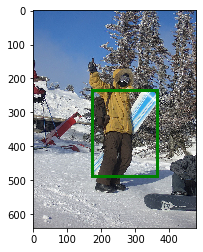

{'image_id': 274266, 'split': 'train', 'sentences': [{'tokens': ['a', 'man', 'standing', 'next', 'to', 'a', 'young', 'girl', 'on', 'a', 'grassy', 'hillside'], 'raw': 'A man standing next to a young girl on a grassy hillside', 'sent_id': 43, 'sent': 'a man standing next to a young girl on a grassy hillside'}, {'tokens': ['a', 'man', 'in', 'a', 'black', 'jacket'], 'raw': 'A man in a black jacket.', 'sent_id': 44, 'sent': 'a man in a black jacket'}], 'file_name': 'COCO_train2014_000000274266_443573.jpg', 'category_id': 1, 'ann_id': 443573, 'sent_ids': [43, 44], 'ref_id': 5019}
The label is %s.
%s. %s
%s. %s


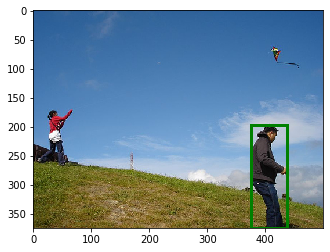

{'image_id': 402757, 'split': 'train', 'sentences': [{'tokens': ['a', 'zebra', 'standing', 'in', 'front', 'of', '3', 'other', 'zebras'], 'raw': 'A zebra standing in front of 3 other zebras.', 'sent_id': 45, 'sent': 'a zebra standing in front of 3 other zebras'}, {'tokens': ['a', 'zebra', 'standing', 'facing', 'to', 'the', 'left', 'in', 'front', 'of', 'the', 'others', ',', 'the', 'closest', 'to', 'the', 'camera'], 'raw': 'A zebra standing facing to the left in front of the others, the closest to the camera.', 'sent_id': 46, 'sent': 'a zebra standing facing to the left in front of the others , the closest to the camera'}], 'file_name': 'COCO_train2014_000000402757_589403.jpg', 'category_id': 24, 'ann_id': 589403, 'sent_ids': [45, 46], 'ref_id': 5020}
The label is %s.
%s. %s
%s. %s


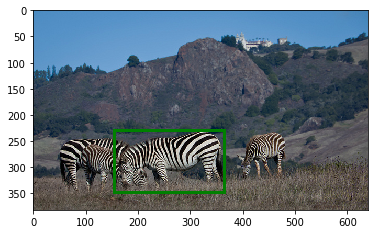

{'image_id': 509971, 'split': 'train', 'sentences': [{'tokens': ['a', 'woman', 'standing', 'between', '2', 'men', 'with', 'green', 'shirt', 'and', 'large', 'belt', 'buckle'], 'raw': 'A woman standing between 2 men with green shirt and large belt buckle.', 'sent_id': 47, 'sent': 'a woman standing between 2 men with green shirt and large belt buckle'}, {'tokens': ['a', 'lady', 'standing', 'next', 'to', 'a', 'man', 'wearing', 'a', 'blue', 'suit', 'and', 'tie'], 'raw': 'A lady standing next to a man wearing a blue suit and tie.', 'sent_id': 48, 'sent': 'a lady standing next to a man wearing a blue suit and tie'}], 'file_name': 'COCO_train2014_000000509971_454978.jpg', 'category_id': 1, 'ann_id': 454978, 'sent_ids': [47, 48], 'ref_id': 5021}
The label is %s.
%s. %s
%s. %s


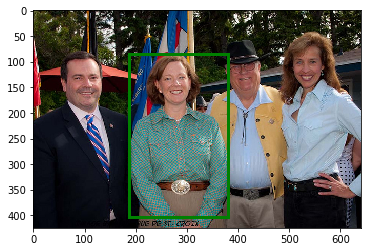

{'image_id': 327183, 'split': 'train', 'sentences': [{'tokens': ['a', 'slice', 'of', 'cheese', 'cake', 'at', 'the', 'top', 'of', 'the', 'fork'], 'raw': 'A slice of cheese cake at the top of the fork.', 'sent_id': 49, 'sent': 'a slice of cheese cake at the top of the fork'}, {'tokens': ['a', 'slice', 'of', 'cake', 'near', 'the', 'fork', "'", 's', 'prongs'], 'raw': "A slice of cake near the fork's prongs.", 'sent_id': 50, 'sent': "a slice of cake near the fork ' s prongs"}], 'file_name': 'COCO_train2014_000000327183_1086048.jpg', 'category_id': 61, 'ann_id': 1086048, 'sent_ids': [49, 50], 'ref_id': 5022}
The label is %s.
%s. %s
%s. %s


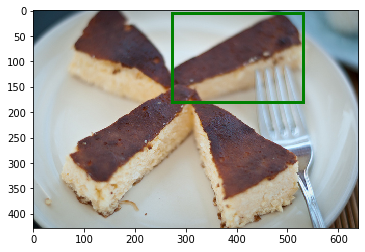

{'image_id': 417347, 'split': 'train', 'sentences': [{'tokens': ['an', 'umpire', 'watching', 'the', 'pitch'], 'raw': 'An umpire watching the pitch.', 'sent_id': 51, 'sent': 'an umpire watching the pitch'}, {'tokens': ['an', 'umpire', 'in', 'the', 'ready', 'position', ',', 'wearing', 'all', 'black', 'as', 'usual'], 'raw': 'An umpire in the ready position, wearing all black as usual.', 'sent_id': 52, 'sent': 'an umpire in the ready position , wearing all black as usual'}], 'file_name': 'COCO_train2014_000000417347_542874.jpg', 'category_id': 1, 'ann_id': 542874, 'sent_ids': [51, 52], 'ref_id': 5023}
The label is %s.
%s. %s
%s. %s


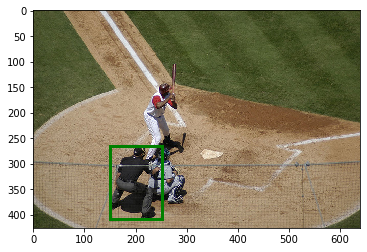

{'image_id': 333634, 'split': 'train', 'sentences': [{'tokens': ['the', 'baseball', 'player', 'making', 'the', 'motion', 'of', 'being', 'safe', 'in', 'baseball'], 'raw': 'The baseball player making the motion of being safe in baseball.', 'sent_id': 53, 'sent': 'the baseball player making the motion of being safe in baseball'}, {'tokens': ['a', 'referee', 'officiating', 'a', 'baseball', 'game'], 'raw': 'A referee officiating a baseball game', 'sent_id': 54, 'sent': 'a referee officiating a baseball game'}], 'file_name': 'COCO_train2014_000000333634_492708.jpg', 'category_id': 1, 'ann_id': 492708, 'sent_ids': [53, 54], 'ref_id': 5024}
The label is %s.
%s. %s
%s. %s


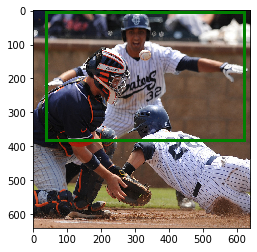

{'image_id': 309260, 'split': 'train', 'sentences': [{'tokens': ['a', 'car', 'outside', 'to', 'the', 'right', 'of', 'the', 'red', 'box'], 'raw': 'A car outside to the right of the red box.', 'sent_id': 55, 'sent': 'a car outside to the right of the red box'}, {'tokens': ['car', 'parked', 'outside', 'the', 'window'], 'raw': 'Car parked outside the window.', 'sent_id': 56, 'sent': 'car parked outside the window'}], 'file_name': 'COCO_train2014_000000309260_358510.jpg', 'category_id': 3, 'ann_id': 358510, 'sent_ids': [55, 56], 'ref_id': 5025}
The label is %s.
%s. %s
%s. %s


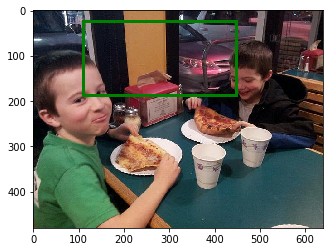

{'image_id': 322558, 'split': 'train', 'sentences': [{'tokens': ['pink', 'case'], 'raw': 'pink case', 'sent_id': 57, 'sent': 'pink case'}, {'tokens': ['a', 'pink', 'suitcase', 'cake'], 'raw': 'A pink suitcase cake.', 'sent_id': 58, 'sent': 'a pink suitcase cake'}], 'file_name': 'COCO_train2014_000000322558_1187202.jpg', 'category_id': 33, 'ann_id': 1187202, 'sent_ids': [57, 58], 'ref_id': 5026}
The label is %s.
%s. %s
%s. %s


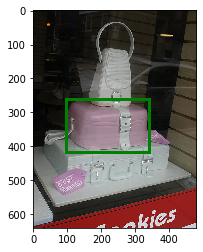

{'image_id': 533220, 'split': 'train', 'sentences': [{'tokens': ['a', 'bush', 'of', 'plant', 'behind', 'middle', 'woman'], 'raw': 'a bush of plant behind middle woman', 'sent_id': 61, 'sent': 'a bush of plant behind middle woman'}, {'tokens': ['green', 'plant', 'behind', 'a', 'table', 'visible', 'behind', 'a', 'lady', "'", 's', 'head'], 'raw': "Green plant behind a table visible behind a lady's head.", 'sent_id': 62, 'sent': "green plant behind a table visible behind a lady ' s head"}], 'file_name': 'COCO_train2014_000000533220_1954731.jpg', 'category_id': 64, 'ann_id': 1954731, 'sent_ids': [61, 62], 'ref_id': 5027}
The label is %s.
%s. %s
%s. %s


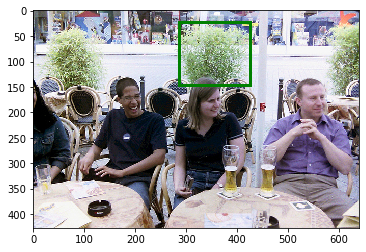

{'image_id': 74060, 'split': 'train', 'sentences': [{'tokens': ['the', 'adult', 'giraffe'], 'raw': 'The adult giraffe.', 'sent_id': 63, 'sent': 'the adult giraffe'}, {'tokens': ['a', 'mother', 'giraffe', 'lickicking', 'her', 'baby'], 'raw': 'A MOTHER GIRAFFE LICKICKING HER BABY.', 'sent_id': 64, 'sent': 'a mother giraffe lickicking her baby'}], 'file_name': 'COCO_train2014_000000074060_594421.jpg', 'category_id': 25, 'ann_id': 594421, 'sent_ids': [63, 64], 'ref_id': 5028}
The label is %s.
%s. %s
%s. %s


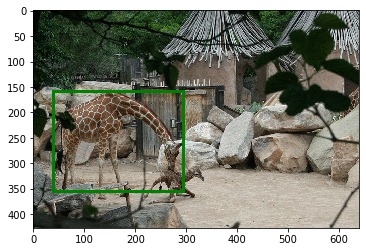

{'image_id': 100316, 'split': 'train', 'sentences': [{'tokens': ['a', 'foam', '-', 'free', 'espresso', 'in', 'a', 'white', 'cup', 'with', 'a', 'spoon', 'atop', 'a', 'white', 'saucer'], 'raw': 'A foam-free espresso in a white cup with a spoon atop a white saucer.', 'sent_id': 65, 'sent': 'a foam - free espresso in a white cup with a spoon atop a white saucer'}, {'tokens': ['a', 'cup', 'of', 'coffiee', 'in', 'the', 'table'], 'raw': 'a cup of coffiee in the table', 'sent_id': 66, 'sent': 'a cup of coffiee in the table'}], 'file_name': 'COCO_train2014_000000100316_1509974.jpg', 'category_id': 47, 'ann_id': 1509974, 'sent_ids': [65, 66], 'ref_id': 5029}
The label is %s.
%s. %s
%s. %s


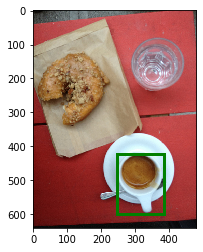

{'image_id': 452783, 'split': 'train', 'sentences': [{'tokens': ['a', 'sandal', 'colour', 'teddy', 'bear', 'in', 'between', 'the', 'other', 'two', 'teddys'], 'raw': 'A sandal colour teddy bear in between the other two teddys.', 'sent_id': 67, 'sent': 'a sandal colour teddy bear in between the other two teddys'}, {'tokens': ['a', 'stuffed', 'bear', 'between', 'two', 'others'], 'raw': 'a stuffed bear between two others', 'sent_id': 68, 'sent': 'a stuffed bear between two others'}], 'file_name': 'COCO_train2014_000000452783_1996319.jpg', 'category_id': 88, 'ann_id': 1996319, 'sent_ids': [67, 68], 'ref_id': 5030}
The label is %s.
%s. %s
%s. %s


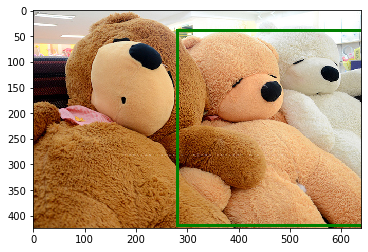

{'image_id': 495149, 'split': 'train', 'sentences': [{'tokens': ['a', 'young', 'man', 'wearing', 'a', 'white', 'shirt', ',', 'sticking', 'out', 'his', 'tongue'], 'raw': 'A young man wearing a white shirt, sticking out his tongue.', 'sent_id': 69, 'sent': 'a young man wearing a white shirt , sticking out his tongue'}, {'tokens': ['a', 'man', 'showing', 'his', 'tongue', 'and', 'operating', 'laptop'], 'raw': 'A MAN SHOWING HIS TONGUE AND OPERATING LAPTOP', 'sent_id': 70, 'sent': 'a man showing his tongue and operating laptop'}], 'file_name': 'COCO_train2014_000000495149_437377.jpg', 'category_id': 1, 'ann_id': 437377, 'sent_ids': [69, 70], 'ref_id': 5031}
The label is %s.
%s. %s
%s. %s


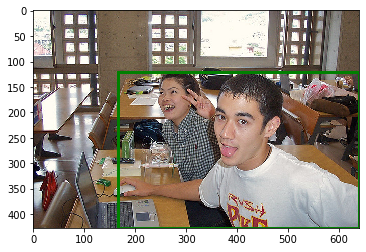

{'image_id': 185558, 'split': 'train', 'sentences': [{'tokens': ['a', 'lady', 'in', 'blue', 't', '-', 'shirt', 'and', 'white', 'shorts', 'sitting', 'on', 'a', 'park', 'bench'], 'raw': 'A lady in blue t-shirt and white shorts sitting on a park bench.', 'sent_id': 75, 'sent': 'a lady in blue t - shirt and white shorts sitting on a park bench'}, {'tokens': ['a', 'couple', 'of', 'friends', 'are', 'sitting', 'on', 'a', 'bench', 'and', 'hanging', 'out'], 'raw': 'A couple of friends are sitting on a bench and hanging out.', 'sent_id': 76, 'sent': 'a couple of friends are sitting on a bench and hanging out'}], 'file_name': 'COCO_train2014_000000185558_468642.jpg', 'category_id': 1, 'ann_id': 468642, 'sent_ids': [75, 76], 'ref_id': 5032}
The label is %s.
%s. %s
%s. %s


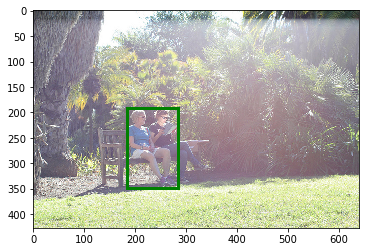

{'image_id': 122863, 'split': 'train', 'sentences': [{'tokens': ['the', 'woman', 'in', 'the', 'yellow', 'shirt'], 'raw': 'The woman in the yellow shirt.', 'sent_id': 77, 'sent': 'the woman in the yellow shirt'}, {'tokens': ['a', 'woman', 'in', 'a', 'yellow', 'shirt'], 'raw': 'A woman in a yellow shirt.', 'sent_id': 78, 'sent': 'a woman in a yellow shirt'}], 'file_name': 'COCO_train2014_000000122863_196114.jpg', 'category_id': 1, 'ann_id': 196114, 'sent_ids': [77, 78], 'ref_id': 5033}
The label is %s.
%s. %s
%s. %s


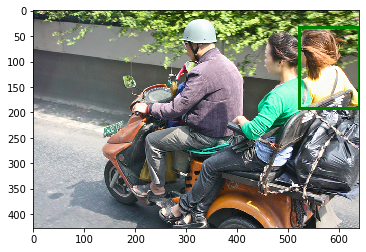

{'image_id': 399841, 'split': 'train', 'sentences': [{'tokens': ['a', 'clear', 'water', 'pitcher'], 'raw': 'A clear water pitcher.', 'sent_id': 81, 'sent': 'a clear water pitcher'}, {'tokens': ['the', 'water', 'carafe', 'on', 'the', 'table'], 'raw': 'the water carafe on the table', 'sent_id': 82, 'sent': 'the water carafe on the table'}], 'file_name': 'COCO_train2014_000000399841_2215284.jpg', 'category_id': 47, 'ann_id': 2215284, 'sent_ids': [81, 82], 'ref_id': 5034}
The label is %s.
%s. %s
%s. %s


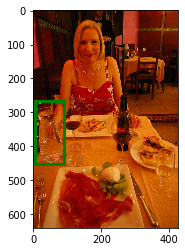

{'image_id': 346997, 'split': 'train', 'sentences': [{'tokens': ['a', 'man', 'is', 'playing', 'guitar', 'while', 'the', 'others', 'enjoying', 'the', 'same'], 'raw': 'a man is playing guitar while the others enjoying the same', 'sent_id': 83, 'sent': 'a man is playing guitar while the others enjoying the same'}, {'tokens': ['a', 'man', 'holding', 'a', 'guitar'], 'raw': 'A man holding a guitar', 'sent_id': 84, 'sent': 'a man holding a guitar'}], 'file_name': 'COCO_train2014_000000346997_220539.jpg', 'category_id': 1, 'ann_id': 220539, 'sent_ids': [83, 84], 'ref_id': 5035}
The label is %s.
%s. %s
%s. %s


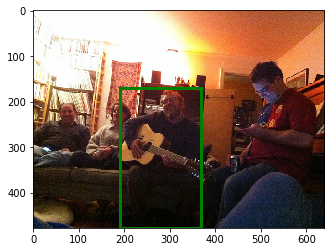

{'image_id': 566681, 'split': 'train', 'sentences': [{'tokens': ['a', 'blonde', 'woman', 'in', 'a', 'white', 'shirt', 'and', 'long', 'black', 'skirt'], 'raw': 'A blonde woman in a white shirt and long black skirt.', 'sent_id': 85, 'sent': 'a blonde woman in a white shirt and long black skirt'}, {'tokens': ['there', 'is', 'one', 'small', 'girl', 'wearing', 'white', 'top', 'is', 'touching', 'the', 'elephant'], 'raw': 'There is one small girl wearing white top is touching the elephant', 'sent_id': 86, 'sent': 'there is one small girl wearing white top is touching the elephant'}], 'file_name': 'COCO_train2014_000000566681_426270.jpg', 'category_id': 1, 'ann_id': 426270, 'sent_ids': [85, 86], 'ref_id': 5036}
The label is %s.
%s. %s
%s. %s


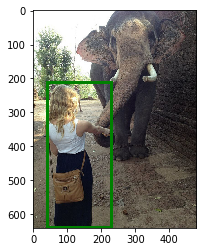

{'image_id': 55767, 'split': 'train', 'sentences': [{'tokens': ['a', 'horse', 'being', 'ridden', 'by', 'number', '6', 'jockey'], 'raw': 'A horse being ridden by number 6 jockey.', 'sent_id': 87, 'sent': 'a horse being ridden by number 6 jockey'}, {'tokens': ['horse', 'which', 'has', 'a', 'blue', 'color', 'rein'], 'raw': 'Horse which has a blue color rein.', 'sent_id': 88, 'sent': 'horse which has a blue color rein'}], 'file_name': 'COCO_train2014_000000055767_60810.jpg', 'category_id': 19, 'ann_id': 60810, 'sent_ids': [87, 88], 'ref_id': 5037}
The label is %s.
%s. %s
%s. %s


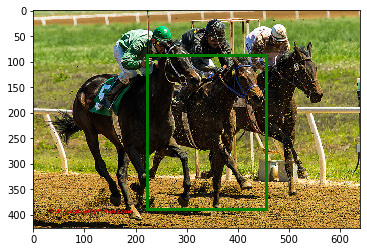

{'image_id': 300197, 'split': 'train', 'sentences': [{'tokens': ['the', 'woman', 'in', 'motion'], 'raw': 'the woman in motion', 'sent_id': 89, 'sent': 'the woman in motion'}, {'tokens': ['the', 'person', 'standing', 'up', 'in', 'the', 'black', 'dress'], 'raw': 'The person standing up in the black dress.', 'sent_id': 90, 'sent': 'the person standing up in the black dress'}], 'file_name': 'COCO_train2014_000000300197_1710985.jpg', 'category_id': 1, 'ann_id': 1710985, 'sent_ids': [89, 90], 'ref_id': 5038}
The label is %s.
%s. %s
%s. %s


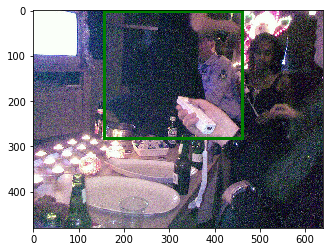

{'image_id': 549423, 'split': 'train', 'sentences': [{'tokens': ['the', 'bird', 'on', 'the', 'right'], 'raw': 'The bird on the right', 'sent_id': 91, 'sent': 'the bird on the right'}, {'tokens': ['bird', 'seen', 'in', 'profile', 'on', 'the', 'woman', "'", 's', 'shoulder'], 'raw': "bird seen in profile on the woman's shoulder", 'sent_id': 92, 'sent': "bird seen in profile on the woman ' s shoulder"}], 'file_name': 'COCO_train2014_000000549423_1815001.jpg', 'category_id': 16, 'ann_id': 1815001, 'sent_ids': [91, 92], 'ref_id': 5039}
The label is %s.
%s. %s
%s. %s


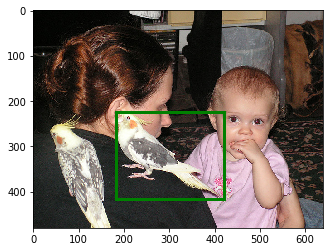

{'image_id': 287903, 'split': 'train', 'sentences': [{'tokens': ['a', 'white', 'horse'], 'raw': 'A white horse', 'sent_id': 93, 'sent': 'a white horse'}, {'tokens': ['the', 'white', 'horse', 'has', 'the', 'word', 'autism', 'written', 'on', 'its', 'back', 'end'], 'raw': 'The white horse has the word Autism written on its back end.', 'sent_id': 94, 'sent': 'the white horse has the word autism written on its back end'}], 'file_name': 'COCO_train2014_000000287903_55419.jpg', 'category_id': 19, 'ann_id': 55419, 'sent_ids': [93, 94], 'ref_id': 5040}
The label is %s.
%s. %s
%s. %s


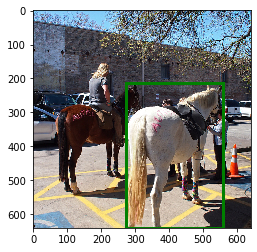

{'image_id': 410969, 'split': 'train', 'sentences': [{'tokens': ['the', 'truck', 'covered', 'in', 'the', 'snow', 'furthest', 'to', 'the', 'right'], 'raw': 'The truck covered in the snow furthest to the right.', 'sent_id': 95, 'sent': 'the truck covered in the snow furthest to the right'}, {'tokens': ['an', 'old', 'truck', 'covered', 'in', 'snow', 'except', 'for', 'the', 'grill', 'and', 'door'], 'raw': 'An old truck covered in snow except for the grill and door', 'sent_id': 96, 'sent': 'an old truck covered in snow except for the grill and door'}], 'file_name': 'COCO_train2014_000000410969_399976.jpg', 'category_id': 8, 'ann_id': 399976, 'sent_ids': [95, 96], 'ref_id': 5041}
The label is %s.
%s. %s
%s. %s


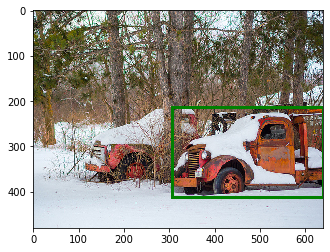

{'image_id': 127882, 'split': 'train', 'sentences': [{'tokens': ['drink', 'cup', 'in', 'the', 'middle', 'of', 'a', 'bunch', 'of', 'fries'], 'raw': 'Drink cup in the middle of a bunch of fries', 'sent_id': 97, 'sent': 'drink cup in the middle of a bunch of fries'}, {'tokens': ['a', 'dimly', 'lit', 'to', '-', 'go', 'cup', 'with', 'a', 'picture', 'of', 'a', 'classic', 'coca', '-', 'cola', 'on', 'it'], 'raw': 'A dimly lit to-go cup with a picture of a classic coca-cola on it.', 'sent_id': 98, 'sent': 'a dimly lit to - go cup with a picture of a classic coca - cola on it'}], 'file_name': 'COCO_train2014_000000127882_677518.jpg', 'category_id': 47, 'ann_id': 677518, 'sent_ids': [97, 98], 'ref_id': 5042}
The label is %s.
%s. %s
%s. %s


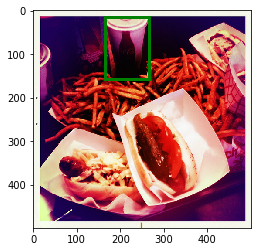

{'image_id': 275377, 'split': 'train', 'sentences': [{'tokens': ['the', 'bench', 'to', 'the', 'far', 'left'], 'raw': 'The bench to the far left.', 'sent_id': 99, 'sent': 'the bench to the far left'}, {'tokens': ['a', 'wooden', 'bench', 'with', 'a', 'person', 'sitting', 'on', 'it'], 'raw': 'A wooden bench with a person sitting on it.', 'sent_id': 100, 'sent': 'a wooden bench with a person sitting on it'}], 'file_name': 'COCO_train2014_000000275377_577627.jpg', 'category_id': 15, 'ann_id': 577627, 'sent_ids': [99, 100], 'ref_id': 5043}
The label is %s.
%s. %s
%s. %s


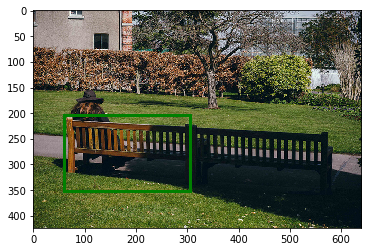

{'image_id': 66381, 'split': 'train', 'sentences': [{'tokens': ['a', 'baseball', 'player', 'in', 'green', 'preparing', 'to', 'hit', 'the', 'ball'], 'raw': 'A baseball player in green preparing to hit the ball', 'sent_id': 103, 'sent': 'a baseball player in green preparing to hit the ball'}, {'tokens': ['a', 'man', 'in', 'a', 'green', 'shirt', 'readies', 'himself', 'to', 'hit', 'the', 'ball'], 'raw': 'A man in a green shirt readies himself to hit the ball.', 'sent_id': 104, 'sent': 'a man in a green shirt readies himself to hit the ball'}], 'file_name': 'COCO_train2014_000000066381_1231608.jpg', 'category_id': 1, 'ann_id': 1231608, 'sent_ids': [103, 104], 'ref_id': 5044}
The label is %s.
%s. %s
%s. %s


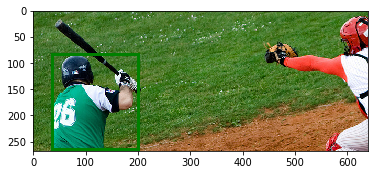

{'image_id': 106222, 'split': 'train', 'sentences': [{'tokens': ['a', 'person', 'snowboarding', 'in', 'a', 'red', ',', 'white', 'and', 'black', 'jacket', ',', 'bending', 'over'], 'raw': 'A person snowboarding in a red, white and black jacket, bending over', 'sent_id': 109, 'sent': 'a person snowboarding in a red , white and black jacket , bending over'}, {'tokens': ['snow', 'boarder', 'bending'], 'raw': 'snow boarder bending', 'sent_id': 110, 'sent': 'snow boarder bending'}], 'file_name': 'COCO_train2014_000000106222_485164.jpg', 'category_id': 1, 'ann_id': 485164, 'sent_ids': [109, 110], 'ref_id': 5045}
The label is %s.
%s. %s
%s. %s


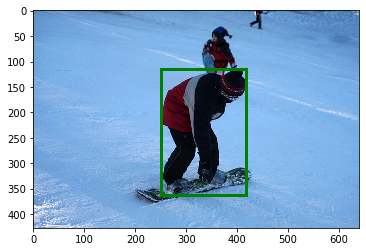

{'image_id': 482196, 'split': 'train', 'sentences': [{'tokens': ['a', 'man', 'on', 'the', 'right', 'end', 'of', 'the', 'table', 'is', 'putting', 'spoon', 'in', 'the', 'food'], 'raw': 'A man on the right end of the table is putting spoon in the food', 'sent_id': 115, 'sent': 'a man on the right end of the table is putting spoon in the food'}, {'tokens': ['the', 'biggest', 'spoon', 'showing', 'the', 'back', 'of', 'the', 'spoon'], 'raw': 'The biggest spoon showing the back of the spoon.', 'sent_id': 116, 'sent': 'the biggest spoon showing the back of the spoon'}], 'file_name': 'COCO_train2014_000000482196_704468.jpg', 'category_id': 50, 'ann_id': 704468, 'sent_ids': [115, 116], 'ref_id': 5046}
The label is %s.
%s. %s
%s. %s


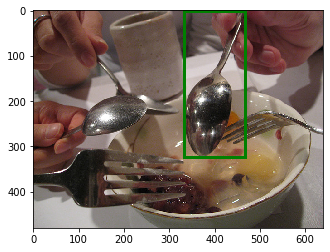

{'image_id': 477392, 'split': 'train', 'sentences': [{'tokens': ['the', 'white', 'horse', 'in', 'the', 'right', 'hand', 'picture'], 'raw': 'the white horse in the right hand picture', 'sent_id': 119, 'sent': 'the white horse in the right hand picture'}, {'tokens': ['a', 'white', 'horse'], 'raw': 'A white horse.', 'sent_id': 120, 'sent': 'a white horse'}], 'file_name': 'COCO_train2014_000000477392_57671.jpg', 'category_id': 19, 'ann_id': 57671, 'sent_ids': [119, 120], 'ref_id': 5047}
The label is %s.
%s. %s
%s. %s


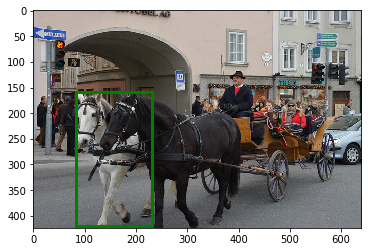

{'image_id': 193452, 'split': 'train', 'sentences': [{'tokens': ['some', 'kind', 'of', 'white', 'dip', 'for', 'the', 'snacks'], 'raw': 'Some kind of white dip for the snacks.', 'sent_id': 121, 'sent': 'some kind of white dip for the snacks'}, {'tokens': ['a', 'bowl', 'with', 'white', 'cream'], 'raw': 'a bowl with white cream', 'sent_id': 122, 'sent': 'a bowl with white cream'}], 'file_name': 'COCO_train2014_000000193452_710214.jpg', 'category_id': 51, 'ann_id': 710214, 'sent_ids': [121, 122], 'ref_id': 5048}
The label is %s.
%s. %s
%s. %s


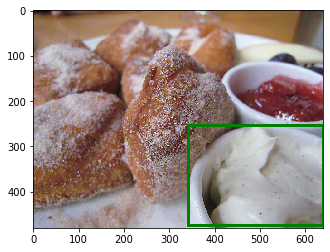

{'image_id': 523718, 'split': 'train', 'sentences': [{'tokens': ['woman', 'in', 'the', 'white', 'dress'], 'raw': 'Woman in the white dress.', 'sent_id': 123, 'sent': 'woman in the white dress'}, {'tokens': ['a', 'woman', 'in', 'a', 'dress', 'is', 'playing', 'with', 'a', 'kite'], 'raw': 'A woman in a dress is playing with a kite', 'sent_id': 124, 'sent': 'a woman in a dress is playing with a kite'}], 'file_name': 'COCO_train2014_000000523718_437139.jpg', 'category_id': 1, 'ann_id': 437139, 'sent_ids': [123, 124], 'ref_id': 5049}
The label is %s.
%s. %s
%s. %s


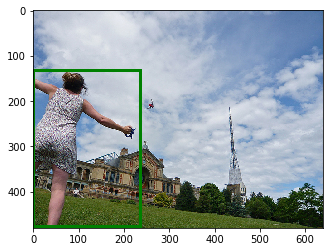

{'image_id': 412566, 'split': 'train', 'sentences': [{'tokens': ['a', 'woman', 'wearing', 'an', 'orange', 'shirt'], 'raw': 'A woman wearing an orange shirt.', 'sent_id': 125, 'sent': 'a woman wearing an orange shirt'}, {'tokens': ['a', 'woman', 'in', 'red', 'dress'], 'raw': 'A woman in red dress', 'sent_id': 126, 'sent': 'a woman in red dress'}], 'file_name': 'COCO_train2014_000000412566_2149859.jpg', 'category_id': 1, 'ann_id': 2149859, 'sent_ids': [125, 126], 'ref_id': 5050}
The label is %s.
%s. %s
%s. %s


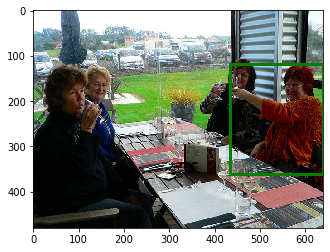

{'image_id': 296760, 'split': 'train', 'sentences': [{'tokens': ['black', 'and', 'white', 'dog', 'with', 'pointy', 'ears'], 'raw': 'Black and white dog with pointy ears.', 'sent_id': 127, 'sent': 'black and white dog with pointy ears'}, {'tokens': ['the', 'black', 'and', 'white', 'dog', 'nearest', 'the', 'wall'], 'raw': 'The black and white dog nearest the wall.', 'sent_id': 128, 'sent': 'the black and white dog nearest the wall'}], 'file_name': 'COCO_train2014_000000296760_17811.jpg', 'category_id': 18, 'ann_id': 17811, 'sent_ids': [127, 128], 'ref_id': 5051}
The label is %s.
%s. %s
%s. %s


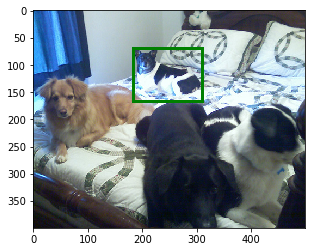

{'image_id': 255978, 'split': 'train', 'sentences': [{'tokens': ['a', 'man', 'wearing', 'a', 'blue', 'shirt', 'and', 'bluejeans', 'looks', 'at', 'kites'], 'raw': 'A man wearing a blue shirt and bluejeans looks at kites.', 'sent_id': 130, 'sent': 'a man wearing a blue shirt and bluejeans looks at kites'}, {'tokens': ['a', 'man', 'in', 'a', 'blue', 'jacket', 'looks', 'to', 'the', 'right'], 'raw': 'A man in a blue jacket looks to the right.', 'sent_id': 131, 'sent': 'a man in a blue jacket looks to the right'}], 'file_name': 'COCO_train2014_000000255978_476691.jpg', 'category_id': 1, 'ann_id': 476691, 'sent_ids': [130, 131], 'ref_id': 5053}
The label is %s.
%s. %s
%s. %s


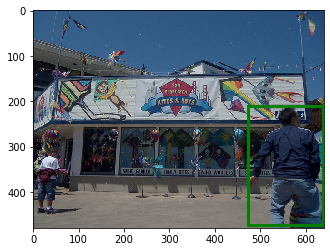

{'image_id': 374391, 'split': 'train', 'sentences': [{'tokens': ['a', 'brown', 'bear', 'near', 'a', 'soda', 'bottle'], 'raw': 'a brown bear near a soda bottle', 'sent_id': 134, 'sent': 'a brown bear near a soda bottle'}, {'tokens': ['a', 'without', 'hairy', 'brown', 'color', 'teddy', 'bear'], 'raw': 'A WITHOUT HAIRY BROWN COLOR TEDDY BEAR', 'sent_id': 135, 'sent': 'a without hairy brown color teddy bear'}], 'file_name': 'COCO_train2014_000000374391_1161210.jpg', 'category_id': 88, 'ann_id': 1161210, 'sent_ids': [134, 135], 'ref_id': 5054}
The label is %s.
%s. %s
%s. %s


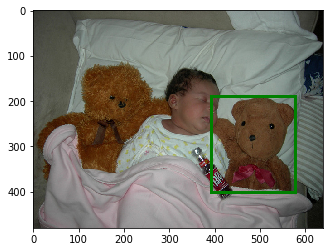

{'image_id': 276343, 'split': 'train', 'sentences': [{'tokens': ['an', 'elephant', 'with', 'it', "'", 's', 'trunk', 'in', 'it', "'", 's', 'mouth'], 'raw': "An elephant with it's trunk in it's mouth.", 'sent_id': 136, 'sent': "an elephant with it ' s trunk in it ' s mouth"}, {'tokens': ['an', 'elephant', 'raising', 'its', 'trunk', 'behind', 'another', 'elephant'], 'raw': 'An elephant raising its trunk behind another elephant.', 'sent_id': 137, 'sent': 'an elephant raising its trunk behind another elephant'}], 'file_name': 'COCO_train2014_000000276343_580520.jpg', 'category_id': 22, 'ann_id': 580520, 'sent_ids': [136, 137], 'ref_id': 5055}
The label is %s.
%s. %s
%s. %s


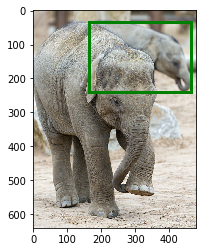

{'image_id': 224508, 'split': 'train', 'sentences': [{'tokens': ['darkest', 'colored', 'horse'], 'raw': 'darkest colored horse', 'sent_id': 138, 'sent': 'darkest colored horse'}, {'tokens': ['a', 'dark', 'brown', 'horse', 'being', 'rode', 'by', 'a', 'girl', 'in', 'light', 'blue'], 'raw': 'a dark brown horse being rode by a girl in light blue', 'sent_id': 139, 'sent': 'a dark brown horse being rode by a girl in light blue'}], 'file_name': 'COCO_train2014_000000224508_56793.jpg', 'category_id': 19, 'ann_id': 56793, 'sent_ids': [138, 139], 'ref_id': 5056}
The label is %s.
%s. %s
%s. %s


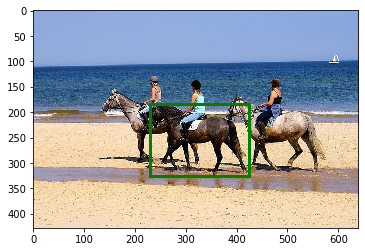

{'image_id': 33633, 'split': 'train', 'sentences': [{'tokens': ['a', 'toasted', 'slice', 'of', 'sandwich', 'on', 'the', 'right', 'on', 'a', 'white', 'plate', 'beside', 'a', 'cup', 'of', 'coffee'], 'raw': 'A toasted slice of  sandwich on the right  on a white plate beside a cup of coffee', 'sent_id': 140, 'sent': 'a toasted slice of sandwich on the right on a white plate beside a cup of coffee'}, {'tokens': ['the', 'right', 'half', 'of', 'the', 'sandwich', 'in', 'front', ',', 'next', 'to', 'te', 'coffee', 'cup'], 'raw': 'The right half of the sandwich in front, next to te coffee cup', 'sent_id': 141, 'sent': 'the right half of the sandwich in front , next to te coffee cup'}], 'file_name': 'COCO_train2014_000000033633_309925.jpg', 'category_id': 54, 'ann_id': 309925, 'sent_ids': [140, 141], 'ref_id': 5057}
The label is %s.
%s. %s
%s. %s


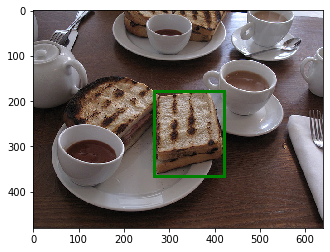

{'image_id': 153394, 'split': 'train', 'sentences': [{'tokens': ['player', '№', '22'], 'raw': 'Player №22.', 'sent_id': 146, 'sent': 'player № 22'}, {'tokens': ['a', 'boy', 'in', 'a', 'baseball', 'uniform', 'reaching', 'out', 'to', 'the', 'guy', 'in', 'front', 'of', 'him'], 'raw': 'A boy in a baseball uniform reaching out to the guy in front of him.', 'sent_id': 147, 'sent': 'a boy in a baseball uniform reaching out to the guy in front of him'}], 'file_name': 'COCO_train2014_000000153394_522461.jpg', 'category_id': 1, 'ann_id': 522461, 'sent_ids': [146, 147], 'ref_id': 5058}
The label is %s.
%s. %s
%s. %s


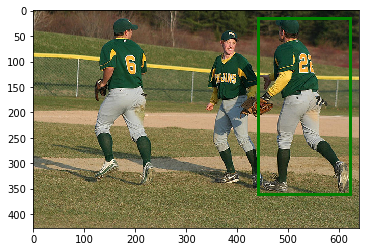

{'image_id': 190796, 'split': 'train', 'sentences': [{'tokens': ['a', 'model', 'is', 'talkig'], 'raw': 'a model is talkig', 'sent_id': 148, 'sent': 'a model is talkig'}, {'tokens': ['lady', 'in', 'white', 'shirt', 'talking', 'on', 'cell', 'phone'], 'raw': 'lady in white shirt talking on cell phone', 'sent_id': 149, 'sent': 'lady in white shirt talking on cell phone'}], 'file_name': 'COCO_train2014_000000190796_428775.jpg', 'category_id': 1, 'ann_id': 428775, 'sent_ids': [148, 149], 'ref_id': 5059}
The label is %s.
%s. %s
%s. %s


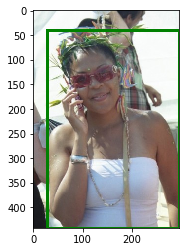

{'image_id': 12756, 'split': 'train', 'sentences': [{'tokens': ['the', 'in', 'focus', 'zebra', 'that', 'is', 'sniffing', 'a', 'tree', 'root'], 'raw': 'the in focus zebra that is sniffing a tree root', 'sent_id': 150, 'sent': 'the in focus zebra that is sniffing a tree root'}, {'tokens': ['a', 'zebra', 'bends', 'down', 'to', 'eat', 'some', 'food'], 'raw': 'A zebra bends down to eat some food.', 'sent_id': 151, 'sent': 'a zebra bends down to eat some food'}], 'file_name': 'COCO_train2014_000000012756_591191.jpg', 'category_id': 24, 'ann_id': 591191, 'sent_ids': [150, 151], 'ref_id': 5060}
The label is %s.
%s. %s
%s. %s


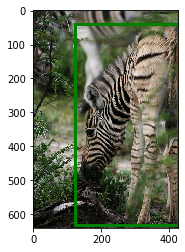

{'image_id': 378451, 'split': 'train', 'sentences': [{'tokens': ['a', 'reflection', 'of', 'the', 'brown', 'bowl'], 'raw': 'A reflection of the brown bowl.', 'sent_id': 152, 'sent': 'a reflection of the brown bowl'}, {'tokens': ['orange', 'base', 'of', 'flower', 'pot'], 'raw': 'orange base of flower pot', 'sent_id': 153, 'sent': 'orange base of flower pot'}], 'file_name': 'COCO_train2014_000000378451_1153708.jpg', 'category_id': 86, 'ann_id': 1153708, 'sent_ids': [152, 153], 'ref_id': 5061}
The label is %s.
%s. %s
%s. %s


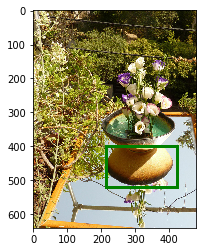

{'image_id': 444830, 'split': 'train', 'sentences': [{'tokens': ['a', 'woman', 'with', 'her', 'hands', 'on', 'her', 'hips', 'standing', 'in', 'front', 'of', 'a', 'wall'], 'raw': 'A woman with her hands on her hips standing in front of a wall.', 'sent_id': 154, 'sent': 'a woman with her hands on her hips standing in front of a wall'}, {'tokens': ['the', 'woman', 'with', 'the', 'black', 'shirt', 'and', 'jeans'], 'raw': 'the woman with the black shirt and jeans.', 'sent_id': 155, 'sent': 'the woman with the black shirt and jeans'}], 'file_name': 'COCO_train2014_000000444830_487377.jpg', 'category_id': 1, 'ann_id': 487377, 'sent_ids': [154, 155], 'ref_id': 5062}
The label is %s.
%s. %s
%s. %s


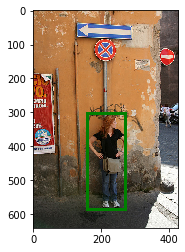

{'image_id': 310277, 'split': 'train', 'sentences': [{'tokens': ['black', 'keyboards', 'of', 'a', 'laptop', 'lying', 'on', 'the', 'table'], 'raw': 'Black keyboards of a laptop lying on the table.', 'sent_id': 156, 'sent': 'black keyboards of a laptop lying on the table'}, {'tokens': ['the', 'black', 'keys', 'with', 'white', 'letters', 'that', 'make', 'up', 'the', 'keyboard', 'of', 'an', 'apple', 'laptop'], 'raw': 'The black keys with white letters that make up the keyboard of an Apple laptop.', 'sent_id': 157, 'sent': 'the black keys with white letters that make up the keyboard of an apple laptop'}], 'file_name': 'COCO_train2014_000000310277_2136685.jpg', 'category_id': 76, 'ann_id': 2136685, 'sent_ids': [156, 157], 'ref_id': 5063}
The label is %s.
%s. %s
%s. %s


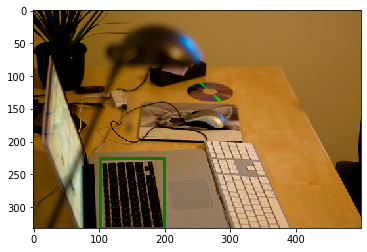

{'image_id': 322707, 'split': 'train', 'sentences': [{'tokens': ['a', 'blue', 'and', 'yellow', 'umbrella', 'that', 'has', 'soda', 'bottles', 'under', 'it'], 'raw': 'A blue and yellow umbrella that has soda bottles under it.', 'sent_id': 158, 'sent': 'a blue and yellow umbrella that has soda bottles under it'}, {'tokens': ['a', 'blue', 'and', 'yellow', 'umbrella', 'on', 'the', 'right'], 'raw': 'a blue and yellow umbrella on the right', 'sent_id': 159, 'sent': 'a blue and yellow umbrella on the right'}], 'file_name': 'COCO_train2014_000000322707_283904.jpg', 'category_id': 28, 'ann_id': 283904, 'sent_ids': [158, 159], 'ref_id': 5064}
The label is %s.
%s. %s
%s. %s


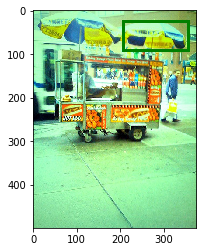

{'image_id': 418770, 'split': 'train', 'sentences': [{'tokens': ['cow', 'in', 'back'], 'raw': 'cow in back', 'sent_id': 160, 'sent': 'cow in back'}, {'tokens': ['the', 'cow', 'next', 'to', 'the', 'corner', 'of', 'the', 'pen', 'in', 'front', 'of', 'the', 'two', 'people', 'in', 'blue', 'and', 'black'], 'raw': 'The cow next to the corner of the pen in front of the two people in blue and black', 'sent_id': 161, 'sent': 'the cow next to the corner of the pen in front of the two people in blue and black'}], 'file_name': 'COCO_train2014_000000418770_1819401.jpg', 'category_id': 21, 'ann_id': 1819401, 'sent_ids': [160, 161], 'ref_id': 5065}
The label is %s.
%s. %s
%s. %s


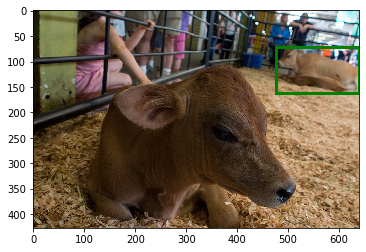

{'image_id': 458057, 'split': 'train', 'sentences': [{'tokens': ['a', 'table', 'with', 'pizza', ',', 'drinks', ',', 'and', 'seasonings', 'on', 'it'], 'raw': 'a table with pizza, drinks, and seasonings on it', 'sent_id': 163, 'sent': 'a table with pizza , drinks , and seasonings on it'}, {'tokens': ['a', 'table', 'of', 'food', ',', 'with', 'plates', ',', 'a', 'pizza', ',', 'pitchers', ',', 'and', 'glasses'], 'raw': 'A table of food, with plates, a pizza, pitchers, and glasses.', 'sent_id': 164, 'sent': 'a table of food , with plates , a pizza , pitchers , and glasses'}], 'file_name': 'COCO_train2014_000000458057_119559.jpg', 'category_id': 67, 'ann_id': 119559, 'sent_ids': [163, 164], 'ref_id': 5067}
The label is %s.
%s. %s
%s. %s


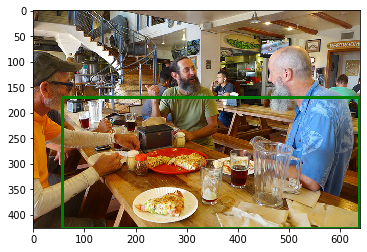

{'image_id': 210252, 'split': 'train', 'sentences': [{'tokens': ['a', 'black', 'car', 'driving', 'down', 'the', 'street', 'next', 'to', 'a', 'man', 'on', 'his', 'cell', 'phone'], 'raw': 'A black car driving down the street next to a man on his cell phone.', 'sent_id': 165, 'sent': 'a black car driving down the street next to a man on his cell phone'}, {'tokens': ['a', 'black', 'car', 'riding', 'down', 'the', 'street'], 'raw': 'A black car riding down the street.', 'sent_id': 166, 'sent': 'a black car riding down the street'}], 'file_name': 'COCO_train2014_000000210252_349421.jpg', 'category_id': 3, 'ann_id': 349421, 'sent_ids': [165, 166], 'ref_id': 5068}
The label is %s.
%s. %s
%s. %s


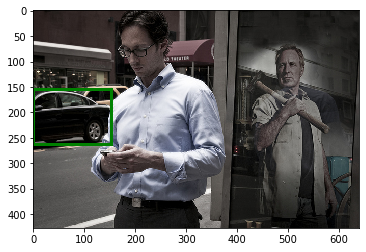

{'image_id': 333151, 'split': 'train', 'sentences': [{'tokens': ['a', 'baseball', 'player', 'with', 'white', 'jersey', 'and', 'neives', 'and', '23', 'written', 'in', 'red', 'running', 'over', 'base'], 'raw': 'A baseball player with white jersey and Neives and 23 written in red running over base.', 'sent_id': 171, 'sent': 'a baseball player with white jersey and neives and 23 written in red running over base'}, {'tokens': ['the', 'man', 'running', 'to', 'first', 'base', 'on', 'the', 'white', 'team'], 'raw': 'the man running to first base on the white team', 'sent_id': 172, 'sent': 'the man running to first base on the white team'}], 'file_name': 'COCO_train2014_000000333151_2205864.jpg', 'category_id': 1, 'ann_id': 2205864, 'sent_ids': [171, 172], 'ref_id': 5069}
The label is %s.
%s. %s
%s. %s


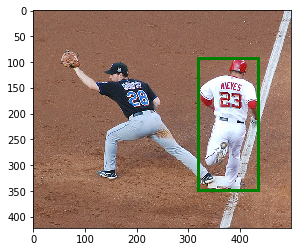

{'image_id': 466827, 'split': 'train', 'sentences': [{'tokens': ['smaller', 'giraffe', 'that', 'is', 'eating'], 'raw': 'Smaller giraffe that is eating.', 'sent_id': 173, 'sent': 'smaller giraffe that is eating'}, {'tokens': ['a', 'giraffe', 'with', 'grass', 'hanging', 'out', 'of', 'its', 'mouth'], 'raw': 'A giraffe with grass hanging out of its mouth.', 'sent_id': 174, 'sent': 'a giraffe with grass hanging out of its mouth'}], 'file_name': 'COCO_train2014_000000466827_597846.jpg', 'category_id': 25, 'ann_id': 597846, 'sent_ids': [173, 174], 'ref_id': 5070}
The label is %s.
%s. %s
%s. %s


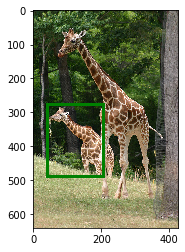

{'image_id': 543350, 'split': 'train', 'sentences': [{'tokens': ['yellow', 'octopus', 'with', 'green', 'eyes', 'and', 'long', 'tentacle', 'kites', 'up', 'in', 'the', 'sky', 'with', 'several', 'other', 'kites'], 'raw': 'Yellow octopus with green eyes and long tentacle kites up in the sky with several other kites.', 'sent_id': 175, 'sent': 'yellow octopus with green eyes and long tentacle kites up in the sky with several other kites'}, {'tokens': ['yellow', 'jellyfish', 'kite', 'flying', 'in', 'sky'], 'raw': 'yellow jellyfish kite flying in sky', 'sent_id': 176, 'sent': 'yellow jellyfish kite flying in sky'}], 'file_name': 'COCO_train2014_000000543350_622574.jpg', 'category_id': 38, 'ann_id': 622574, 'sent_ids': [175, 176], 'ref_id': 5071}
The label is %s.
%s. %s
%s. %s


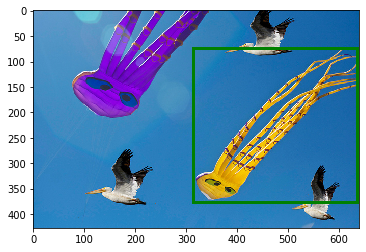

{'image_id': 364458, 'split': 'train', 'sentences': [{'tokens': ['the', 'fucilage', 'of', 'the', 'airplane'], 'raw': 'the fucilage of the airplane', 'sent_id': 177, 'sent': 'the fucilage of the airplane'}, {'tokens': ['landing', 'the', 'aeroplain', 'near', 'by', 'the', 'mahn'], 'raw': 'LANDING THE AEROPLAIN NEAR BY THE MAHN', 'sent_id': 178, 'sent': 'landing the aeroplain near by the mahn'}], 'file_name': 'COCO_train2014_000000364458_161226.jpg', 'category_id': 5, 'ann_id': 161226, 'sent_ids': [177, 178], 'ref_id': 5072}
The label is %s.
%s. %s
%s. %s


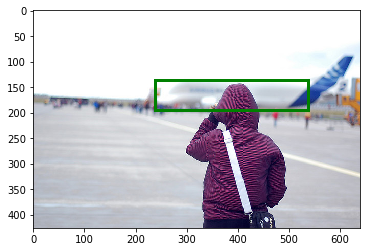

{'image_id': 477272, 'split': 'train', 'sentences': [{'tokens': ['a', 'white', 'aircraft'], 'raw': 'A white aircraft.', 'sent_id': 179, 'sent': 'a white aircraft'}, {'tokens': ['an', 'aeroplane', 'is', 'standing', 'beside', 'another', 'one'], 'raw': 'AN AEROPLANE IS STANDING BESIDE  ANOTHER ONE', 'sent_id': 180, 'sent': 'an aeroplane is standing beside another one'}], 'file_name': 'COCO_train2014_000000477272_162115.jpg', 'category_id': 5, 'ann_id': 162115, 'sent_ids': [179, 180], 'ref_id': 5073}
The label is %s.
%s. %s
%s. %s


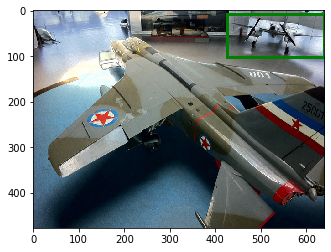

{'image_id': 119561, 'split': 'train', 'sentences': [{'tokens': ['a', 'baby', 'looking', 'angry'], 'raw': 'a baby looking angry', 'sent_id': 182, 'sent': 'a baby looking angry'}, {'tokens': ['a', 'baby', 'sitting', 'in', 'the', 'woman', 'lap'], 'raw': 'A baby sitting in the woman lap.', 'sent_id': 183, 'sent': 'a baby sitting in the woman lap'}], 'file_name': 'COCO_train2014_000000119561_445053.jpg', 'category_id': 1, 'ann_id': 445053, 'sent_ids': [182, 183], 'ref_id': 5074}
The label is %s.
%s. %s
%s. %s


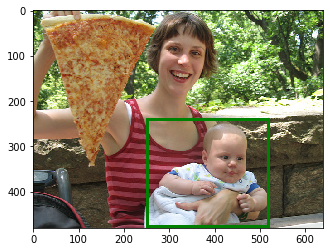

{'image_id': 520434, 'split': 'train', 'sentences': [{'tokens': ['the', 'woman', 'hitting', 'a', 'tennis', 'ball', 'to', 'the', 'right', 'of', 'an', 'identical', 'woman'], 'raw': 'The woman hitting a tennis ball to the right of an identical woman.', 'sent_id': 184, 'sent': 'the woman hitting a tennis ball to the right of an identical woman'}, {'tokens': ['the', 'woman', 'hitting', 'a', 'tennis', 'ball', 'to', 'the', 'right', 'of', 'an', 'identical', 'woman'], 'raw': 'The woman hitting a tennis ball to the right of an identical woman.', 'sent_id': 185, 'sent': 'the woman hitting a tennis ball to the right of an identical woman'}], 'file_name': 'COCO_train2014_000000520434_467547.jpg', 'category_id': 1, 'ann_id': 467547, 'sent_ids': [184, 185], 'ref_id': 5075}
The label is %s.
%s. %s
%s. %s


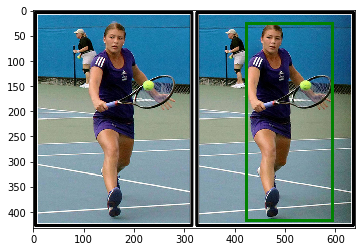

{'image_id': 180179, 'split': 'train', 'sentences': [{'tokens': ['zebra', 'leaning', 'under', 'other', 'zebra'], 'raw': 'Zebra leaning under other zebra.', 'sent_id': 186, 'sent': 'zebra leaning under other zebra'}, {'tokens': ['a', 'young', 'zebra', 'feeding', 'from', 'its', 'mother'], 'raw': 'A young zebra feeding from its mother.', 'sent_id': 187, 'sent': 'a young zebra feeding from its mother'}], 'file_name': 'COCO_train2014_000000180179_589915.jpg', 'category_id': 24, 'ann_id': 589915, 'sent_ids': [186, 187], 'ref_id': 5076}
The label is %s.
%s. %s
%s. %s


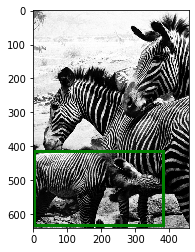

{'image_id': 184664, 'split': 'train', 'sentences': [{'tokens': ['silverware', 'sitting', 'on', 'table', 'to', 'the', 'left', 'of', 'breakfast'], 'raw': 'Silverware sitting on table to the left of breakfast.', 'sent_id': 188, 'sent': 'silverware sitting on table to the left of breakfast'}, {'tokens': ['metal', 'fork', 'placed', 'beside', 'metal', 'butter', 'knife', 'and', 'cell', 'phone'], 'raw': 'Metal fork placed beside metal butter knife and cell phone.', 'sent_id': 189, 'sent': 'metal fork placed beside metal butter knife and cell phone'}], 'file_name': 'COCO_train2014_000000184664_688569.jpg', 'category_id': 48, 'ann_id': 688569, 'sent_ids': [188, 189], 'ref_id': 5077}
The label is %s.
%s. %s
%s. %s


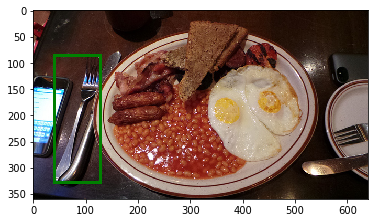

{'image_id': 305105, 'split': 'train', 'sentences': [{'tokens': ['lower', 'right', 'of', 'couch', 'and', 'black', 'arm', 'of', 'chair'], 'raw': 'LOWER RIGHT OF COUCH AND BLACK ARM OF CHAIR', 'sent_id': 190, 'sent': 'lower right of couch and black arm of chair'}, {'tokens': ['a', 'gray', 'couch'], 'raw': 'A gray couch', 'sent_id': 191, 'sent': 'a gray couch'}], 'file_name': 'COCO_train2014_000000305105_111943.jpg', 'category_id': 63, 'ann_id': 111943, 'sent_ids': [190, 191], 'ref_id': 5078}
The label is %s.
%s. %s
%s. %s


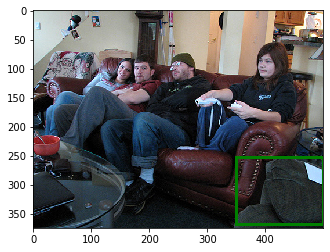

{'image_id': 271396, 'split': 'train', 'sentences': [{'tokens': ['a', 'fat', 'girl', ',', 'trying', 'to', 'hit', 'the', 'serve', 'in', 'the', 'tennis', 'court'], 'raw': 'A fat girl, trying to hit the serve in the tennis court', 'sent_id': 192, 'sent': 'a fat girl , trying to hit the serve in the tennis court'}, {'tokens': ['the', 'woman', 'hitting', 'the', 'ball'], 'raw': 'the woman hitting the ball', 'sent_id': 193, 'sent': 'the woman hitting the ball'}], 'file_name': 'COCO_train2014_000000271396_503651.jpg', 'category_id': 1, 'ann_id': 503651, 'sent_ids': [192, 193], 'ref_id': 5079}
The label is %s.
%s. %s
%s. %s


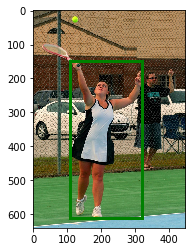

{'image_id': 207289, 'split': 'train', 'sentences': [{'tokens': ['pug', 'with', 'heart', 'shaped', 'tag', 'dangling', 'from', 'his', 'neck'], 'raw': 'Pug with heart shaped tag dangling from his neck.', 'sent_id': 196, 'sent': 'pug with heart shaped tag dangling from his neck'}, {'tokens': ['pug', 'on', 'the', 'left', 'side'], 'raw': 'pug on the left side', 'sent_id': 197, 'sent': 'pug on the left side'}], 'file_name': 'COCO_train2014_000000207289_10048.jpg', 'category_id': 18, 'ann_id': 10048, 'sent_ids': [196, 197], 'ref_id': 5080}
The label is %s.
%s. %s
%s. %s


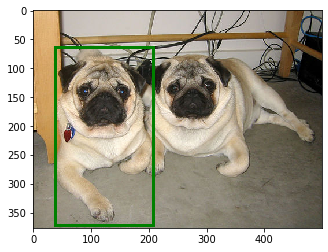

{'image_id': 580631, 'split': 'train', 'sentences': [{'tokens': ['a', 'whip', 'cream', 'creation', 'for', 'a', 'dessert', 'plate'], 'raw': 'A whip cream creation for a dessert plate', 'sent_id': 198, 'sent': 'a whip cream creation for a dessert plate'}, {'tokens': ['decorative', 'pile', 'of', 'whip', 'cream', 'on', 'a', 'white', 'plate'], 'raw': 'Decorative pile of whip cream on a white plate.', 'sent_id': 199, 'sent': 'decorative pile of whip cream on a white plate'}], 'file_name': 'COCO_train2014_000000580631_1088025.jpg', 'category_id': 61, 'ann_id': 1088025, 'sent_ids': [198, 199], 'ref_id': 5081}
The label is %s.
%s. %s
%s. %s


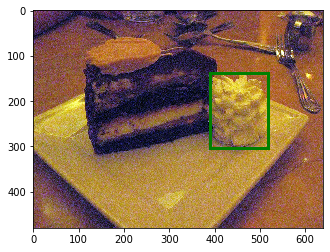

{'image_id': 487118, 'split': 'train', 'sentences': [{'tokens': ['a', 'man', 'holding', 'a', 'wineglass'], 'raw': 'A man holding a wineglass.', 'sent_id': 200, 'sent': 'a man holding a wineglass'}, {'tokens': ['a', 'man', 'in', 'a', 'black', 'shirt', 'with', 'glasses', 'holding', 'a', 'glass'], 'raw': 'A man in a black shirt with glasses holding a glass.', 'sent_id': 201, 'sent': 'a man in a black shirt with glasses holding a glass'}], 'file_name': 'COCO_train2014_000000487118_207710.jpg', 'category_id': 1, 'ann_id': 207710, 'sent_ids': [200, 201], 'ref_id': 5082}
The label is %s.
%s. %s
%s. %s


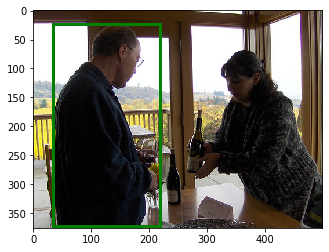

{'image_id': 360283, 'split': 'train', 'sentences': [{'tokens': ['the', 'back', 'of', 'the', 'person', 'wearing', 'a', 'striped', 'shirt'], 'raw': 'The back of the person wearing a striped shirt', 'sent_id': 202, 'sent': 'the back of the person wearing a striped shirt'}, {'tokens': ['a', 'man', 'in', 'a', 'striped', 'shirt'], 'raw': 'a man in a striped shirt', 'sent_id': 203, 'sent': 'a man in a striped shirt'}], 'file_name': 'COCO_train2014_000000360283_1253333.jpg', 'category_id': 1, 'ann_id': 1253333, 'sent_ids': [202, 203], 'ref_id': 5083}
The label is %s.
%s. %s
%s. %s


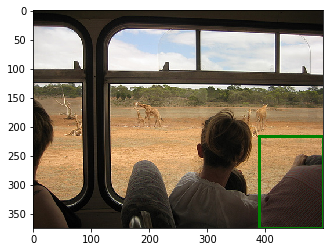

{'image_id': 72809, 'split': 'train', 'sentences': [{'tokens': ['a', 'man', 'wearing', 'brown', 'jacket', 'and', 'black', 'pants', 'drinking', 'coffee', 'from', 'a', 'white', 'cup'], 'raw': 'A man wearing brown jacket and black pants drinking coffee from a white cup.', 'sent_id': 204, 'sent': 'a man wearing brown jacket and black pants drinking coffee from a white cup'}, {'tokens': ['a', 'man', 'wearing', 'a', 'hat', 'sipping', 'on', 'a', 'white', 'cup'], 'raw': 'A man wearing a hat sipping on a white cup.', 'sent_id': 205, 'sent': 'a man wearing a hat sipping on a white cup'}], 'file_name': 'COCO_train2014_000000072809_470045.jpg', 'category_id': 1, 'ann_id': 470045, 'sent_ids': [204, 205], 'ref_id': 5084}
The label is %s.
%s. %s
%s. %s


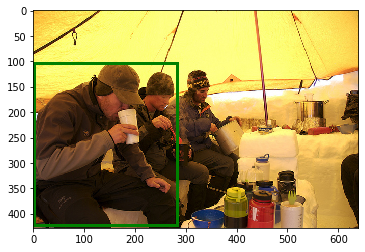

{'image_id': 279883, 'split': 'train', 'sentences': [{'tokens': ['the', 'laptop', 'front', 'of', 'the', 'man', 'with', 'glasses', 'hanging', 'around', 'his', 'neck'], 'raw': 'The laptop front of the man with glasses hanging around his neck', 'sent_id': 206, 'sent': 'the laptop front of the man with glasses hanging around his neck'}, {'tokens': ['a', 'laptop', 'almost', 'covered', 'in', 'stickers'], 'raw': 'A laptop almost covered in stickers.', 'sent_id': 207, 'sent': 'a laptop almost covered in stickers'}], 'file_name': 'COCO_train2014_000000279883_1099999.jpg', 'category_id': 73, 'ann_id': 1099999, 'sent_ids': [206, 207], 'ref_id': 5085}
The label is %s.
%s. %s
%s. %s


KeyboardInterrupt: 

In [17]:
if __name__ == '__main__':
    refer = REFER('./data/', dataset='refcocog', splitBy='google')
    ref_ids = refer.getRefIds()
    print(len(ref_ids))
    
    print(len(refer.Imgs))
    print(len(refer.imgToRefs))

    ref_ids = refer.getRefIds(split='train')
    print('There are %s training referred objects.'.format(len(ref_ids)))

    for ref_id in ref_ids:
        ref = refer.loadRefs(ref_id)[0]
        if len(ref['sentences']) < 2:
            continue

        print(ref)
        print('The label is %s.'.format(refer.Cats[ref['category_id']]))
        plt.figure()
        refer.showRef(ref, seg_box='box')
        plt.show()